
#**SoC 2021 (Un)Clear**

---

##Final Implementation of the ESRGAN Model

###Importing Necessary Modules

In [1]:
import cv2
from google.colab.patches import cv2_imshow

import os
import random
import time
import numpy as np

from matplotlib import pyplot as plt

import tensorflow as tf
from tensorflow.keras.layers import Add,Concatenate,LeakyReLU,Conv2D,Lambda, UpSampling2D
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input

###Setting up the database

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
from google.colab import files
files.upload() 
!pip install -q kaggle
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!ls ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
kaggle.json


In [4]:
!kaggle datasets download -d sharansmenon/div2k

100% 3.71G/3.71G [01:08<00:00, 36.2MB/s]



In [5]:
!unzip "/content/div2k.zip"

Archive:  /content/div2k.zip
  inflating: DIV2K_train_HR/DIV2K_train_HR/0001.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0002.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0003.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0004.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0005.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0006.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0007.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0008.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0009.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0010.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0011.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0012.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0013.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0014.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0015.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0016.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0017.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0018.png  

###Pre processing data


In [6]:
PATH = '/content/DIV2K_train_HR/DIV2K_train_HR'

In [7]:
dimension = 100

def random_crop(input_image):
  initial_height = np.random.randint(0,input_image.shape[0] - dimension)
  initial_width = np.random.randint(0,input_image.shape[1] - dimension)
  image = input_image[initial_height:initial_height + dimension , initial_width:initial_width + dimension]

  return image

def rotate(input_image):
  options = [0, cv2.ROTATE_90_CLOCKWISE, cv2.ROTATE_90_COUNTERCLOCKWISE, cv2.ROTATE_180]
  rotation = options[np.random.randint(0,4)]
  image = cv2.rotate(input_image, rotation)
  
  return image

def load_hr(image_file):
  image = tf.io.read_file(image_file)
  image = tf.image.decode_png(image)
  image = np.asarray(image)
  hr_image = random_crop(image)
  hr_image = rotate(hr_image)

  return hr_image

def load_lr(hr_image):
  lr_image = cv2.resize(hr_image, (dimension // 4,dimension // 4))

  return lr_image

def normalize(image):
  final_image = tf.convert_to_tensor(image , dtype = tf.float32)
  final_image = final_image/127.5 -1
  
  return final_image


train_dataset = os.listdir(PATH)
for i in range(len(train_dataset)):
  train_dataset[i] = PATH + '/'+train_dataset[i]
train_hr_dataset = list(map(load_hr, train_dataset))
train_lr_dataset = list(map(load_lr,train_hr_dataset))
train_hr_dataset = tf.convert_to_tensor(list(map(normalize , train_hr_dataset)))
train_lr_dataset = tf.convert_to_tensor(list(map(normalize , train_lr_dataset)))

Lets see some images from our databse

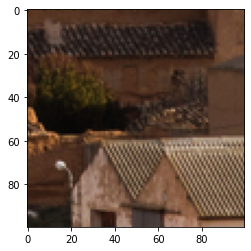

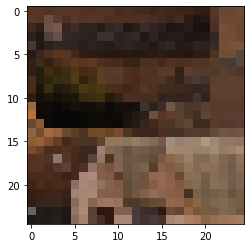

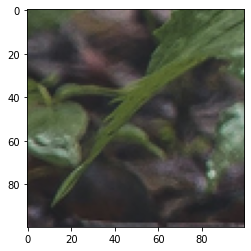

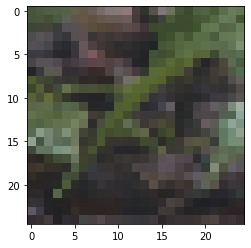

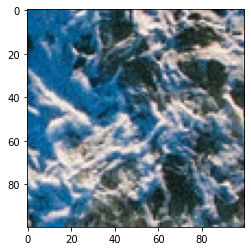

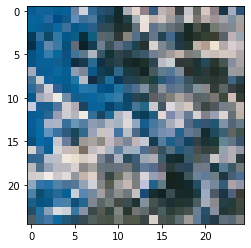

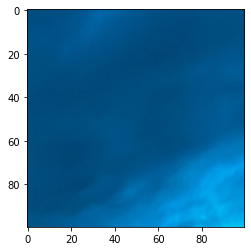

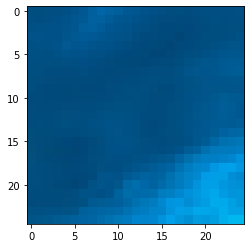

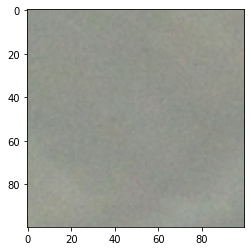

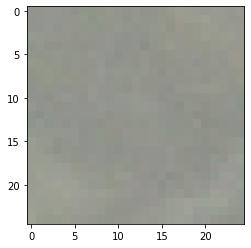

In [8]:
for i in range(5):
    plt.imshow(train_hr_dataset[i]/2 + 0.5)
    plt.show()
    plt.imshow(train_lr_dataset[i]/2 + 0.5)
    plt.show()

###Building the generator

In [9]:
def dense_block(inpt):
  b1 = Conv2D(64, kernel_size=3, strides=1, padding='same')(inpt)
  b1 = LeakyReLU(0.2)(b1)
  b1 = Concatenate()([inpt,b1])
  b2 = Conv2D(64, kernel_size=3, strides=1, padding='same')(b1)
  b2 = LeakyReLU(0.2)(b2)
  b2 = Concatenate()([inpt,b1,b2]) 
  b3 = Conv2D(64, kernel_size=3, strides=1, padding='same')(b2)
  b3 = LeakyReLU(0.2)(b3)
  b3 = Concatenate()([inpt,b1,b2,b3])
  b4 = Conv2D(64, kernel_size=3, strides=1, padding='same')(b3)
  b4 = LeakyReLU(0.2)(b4)
  b4 = Concatenate()([inpt,b1,b2,b3,b4])
  b5 = Conv2D(64, kernel_size=3, strides=1, padding='same')(b4)
  b5 *=0.2
  b5 = Add()([b5, inpt])
    
  return b5

def RRDB(inpt):
  x = dense_block(inpt)
  x = dense_block(x)
  x = dense_block(x)
  x *=0.2
  out = Add()([x,inpt])
  
  return out

In [10]:
def buildGenerator():
  inpt = tf.keras.Input(shape = [dimension // 4, dimension // 4, 3])
  up = UpSampling2D(4)(inpt)
  conv1 =Conv2D(64 , kernel_size = 3 , strides = 1,padding = 'same')(up)
  rrdb = RRDB(conv1)
  conv2 = Conv2D(filters = 256, kernel_size = 3, strides = 1, padding = 'same',activation = 'relu')(rrdb)
  out = Conv2D(3 , kernel_size= 3 , strides = 1 , padding = 'same')(conv2)
  return tf.keras.Model(inputs = inpt , outputs = out)

In [11]:
generator = buildGenerator()
generator.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 25, 25, 3)]  0                                            
__________________________________________________________________________________________________
up_sampling2d (UpSampling2D)    (None, 100, 100, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 100, 100, 64) 1792        up_sampling2d[0][0]              
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 100, 100, 64) 36928       conv2d[0][0]                     
______________________________________________________________________________________________

###Building the Discriminator

In [12]:
from keras import backend as K

def build_discriminator():
 
 leakyrelu_alpha = 0.2
 momentum = 0.8

 input_0 = tf.keras.layers.Input(shape=(dimension // 4, dimension // 4, 3))
 input_0_upscale = UpSampling2D(4)(input_0)

 input_1 = tf.keras.layers.Input(shape = (dimension, dimension, 3))
 input_2 = tf.keras.layers.Input(shape = (dimension, dimension, 3))

 x = tf.keras.layers.concatenate([input_0_upscale,input_1])
 y = tf.keras.layers.concatenate([input_0_upscale,input_2])
  
 for i in range(4):
  x = Conv2D(64 , kernel_size = 6 , strides = 1 , padding = 'same')(x)
  y = Conv2D(64 , kernel_size = 6 , strides = 1 , padding = 'same')(y)
  x = LeakyReLU()(x)
  y = LeakyReLU()(y)
  x = tf.keras.layers.BatchNormalization()(x)
  y = tf.keras.layers.BatchNormalization()(y)

 logits = x-K.mean(y)
 output = Conv2D(3,3, activation='sigmoid' , padding = 'same')(logits)   
   
 model = tf.keras.Model(inputs=[input_0 , input_1,input_2], outputs=[output], name='discriminator')
    
 return model

In [13]:
discriminator = build_discriminator()
discriminator.summary()

Model: "discriminator"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 25, 25, 3)]  0                                            
__________________________________________________________________________________________________
up_sampling2d_1 (UpSampling2D)  (None, 100, 100, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
input_4 (InputLayer)            [(None, 100, 100, 3) 0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 100, 100, 3) 0                                            
______________________________________________________________________________________

###Building the ERSGAN Model


In [14]:
def relativistic_loss(disc_real,disc_gen):
    real = disc_real
    fake = disc_gen
    fake_logits = K.sigmoid(fake - K.mean(real))
    real_logits = K.sigmoid(real - K.mean(fake))
            
    return [fake_logits, real_logits]

In [15]:
def discriminator_loss(fake_logits , real_logits) :
  return  K.mean(K.binary_crossentropy(K.zeros_like(fake_logits),fake_logits)+K.binary_crossentropy(K.ones_like(real_logits),real_logits))

def generator_loss(fake_logits , real_logits) :
  return  K.mean(K.binary_crossentropy(K.zeros_like(real_logits),real_logits)+K.binary_crossentropy(K.ones_like(fake_logits),fake_logits))

In [16]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

vgg = VGG19(include_top = False, input_shape=(dimension,dimension,3))

Lambda = 0.05
Eeta = 1


def train_step(input_lr_image, target, epoch):

  
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_lr_image, training=True)

        real_logits  = discriminator([input_lr_image, target , gen_output], training=True)
        fake_logits  = discriminator([input_lr_image, target , gen_output], training=True)
        gen_loss     = Lambda*generator_loss(fake_logits, real_logits)
        gen_loss    += Eeta*tf.reduce_mean(tf.abs(target - gen_output))
        feature_gen  = vgg(preprocess_input(gen_output))
        feature_real = vgg(preprocess_input(np.copy(target)))
        vgg_loss     = tf.keras.losses.mean_squared_error(feature_gen , feature_real)
        gen_loss    += 100*vgg_loss
        disc_loss = discriminator_loss(fake_logits, real_logits)

    generator_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

80142336/80134624 [==============================] - 1s 0us/step


Epoch 1
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


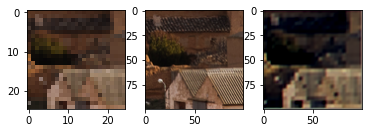

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


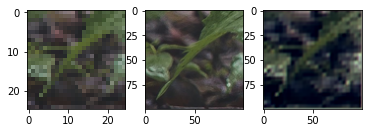

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


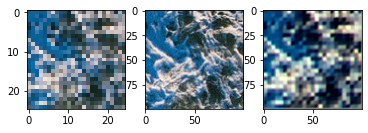

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


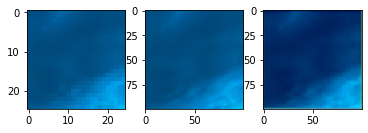

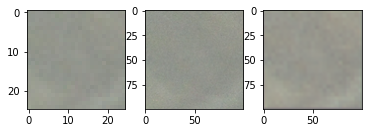

Epoch 1 took 150.6172389984131 sec

Epoch 2
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


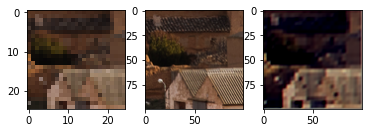

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


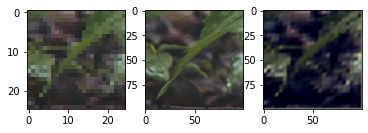

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


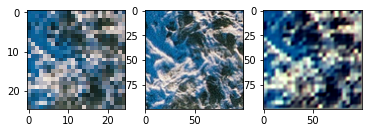

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


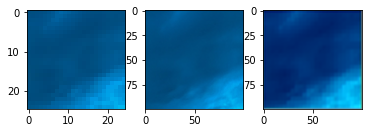

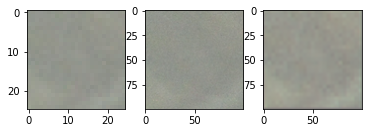

Epoch 2 took 150.88497757911682 sec

Epoch 3
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


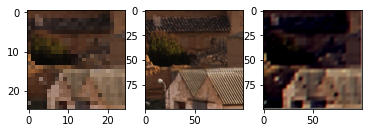

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


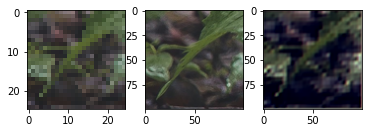

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


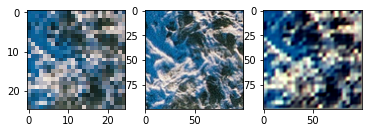

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


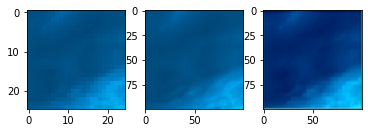

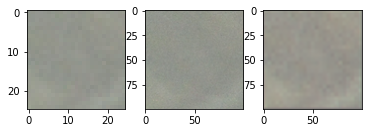

Epoch 3 took 151.17264080047607 sec

Epoch 4
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


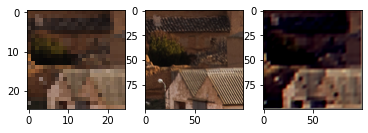

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


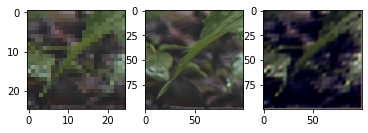

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


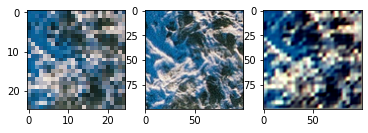

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


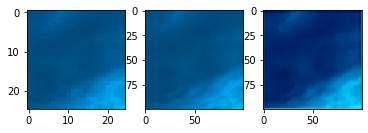

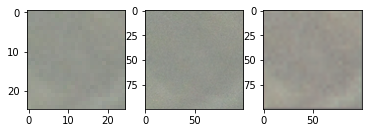

Epoch 4 took 150.40106749534607 sec

Epoch 5
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


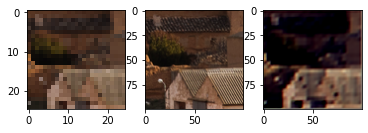

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


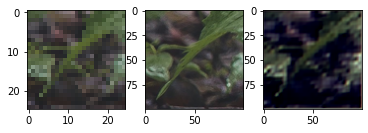

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


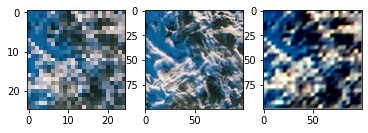

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


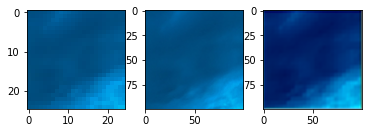

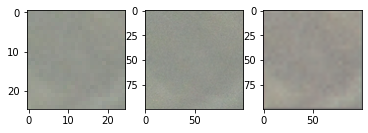

Epoch 5 took 151.14561462402344 sec

Epoch 6
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


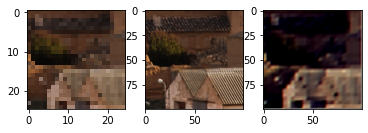

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


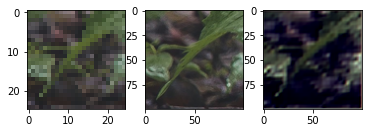

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


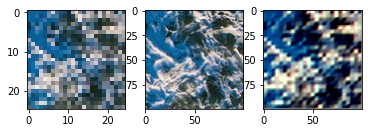

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


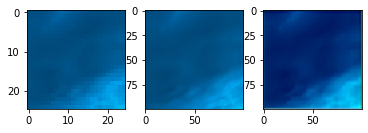

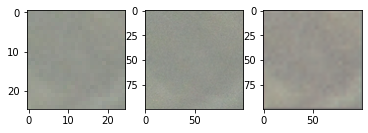

Epoch 6 took 150.7038538455963 sec

Epoch 7
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


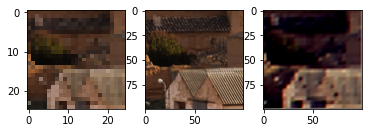

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


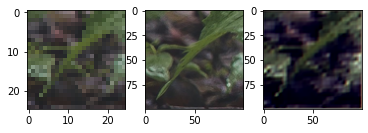

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


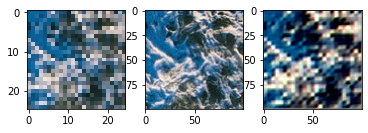

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


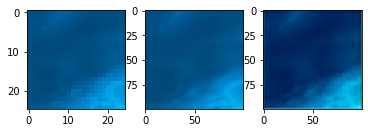

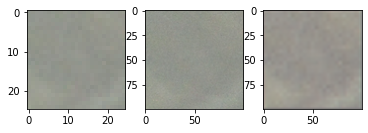

Epoch 7 took 150.354008436203 sec

Epoch 8
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


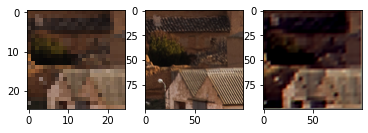

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


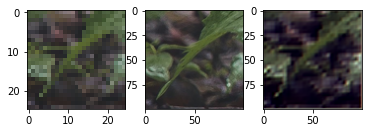

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


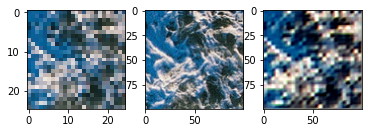

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


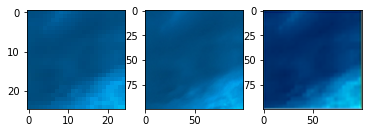

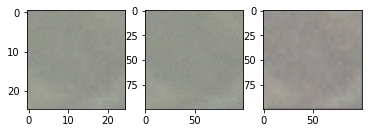

Epoch 8 took 150.2928650379181 sec

Epoch 9
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


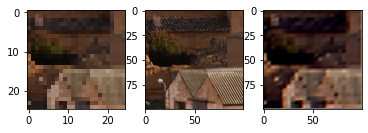

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


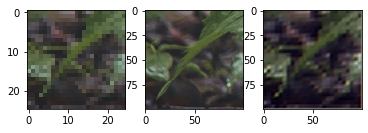

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


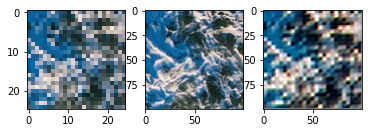

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


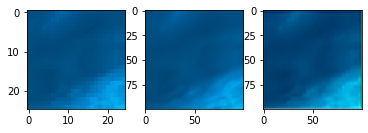

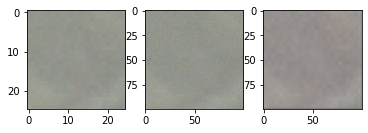

Epoch 9 took 151.0149052143097 sec

Epoch 10
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


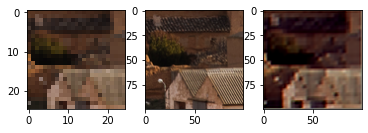

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


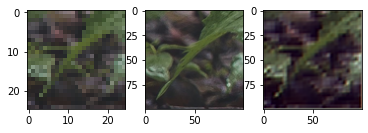

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


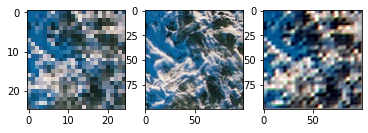

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


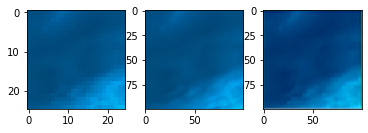

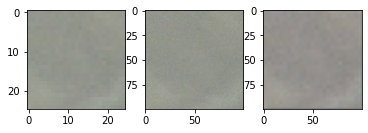

Epoch 10 took 150.74908804893494 sec

Epoch 11
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


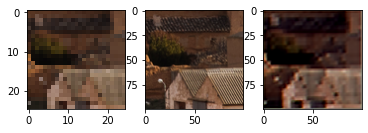

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


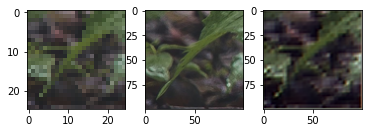

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


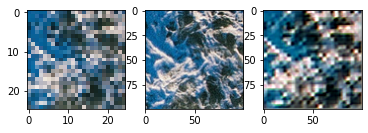

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


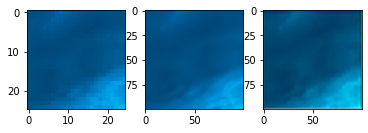

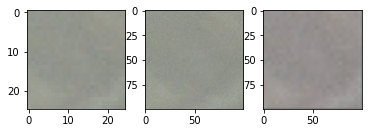

Epoch 11 took 150.93295454978943 sec

Epoch 12
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


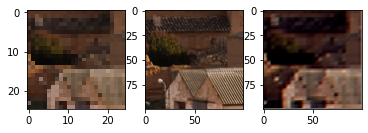

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


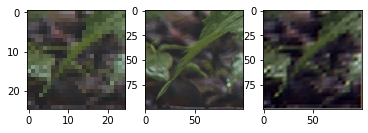

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


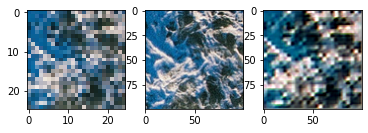

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


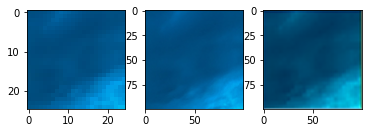

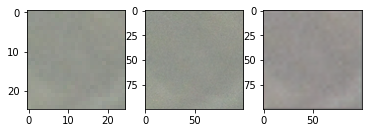

Epoch 12 took 151.01286673545837 sec

Epoch 13
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


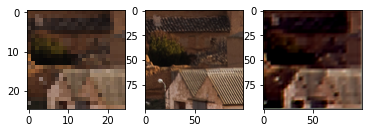

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


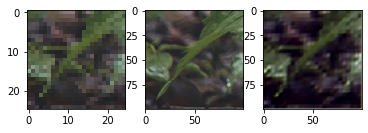

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


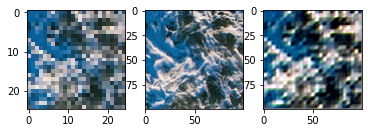

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


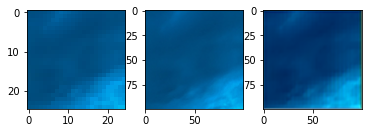

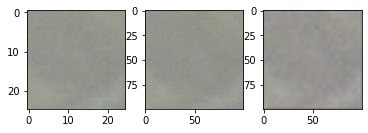

Epoch 13 took 150.7413773536682 sec

Epoch 14
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


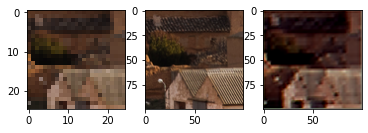

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


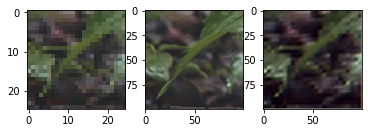

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


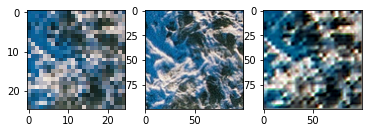

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


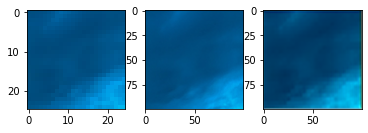

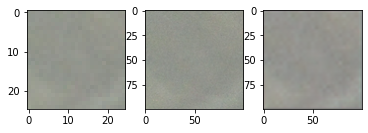

Epoch 14 took 150.79016160964966 sec

Epoch 15
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


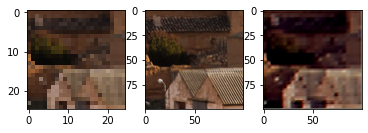

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


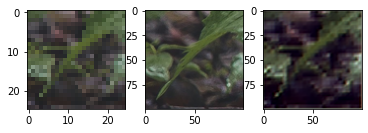

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


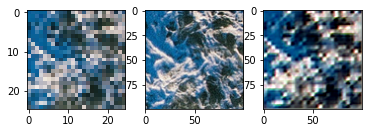

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


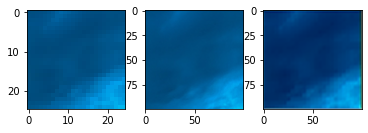

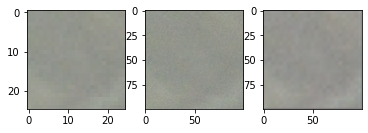

Epoch 15 took 150.86655592918396 sec

Epoch 16
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


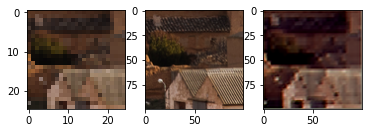

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


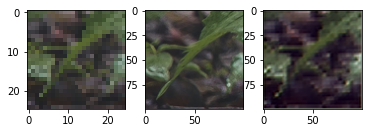

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


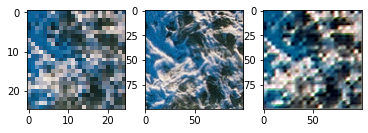

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


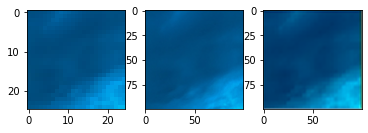

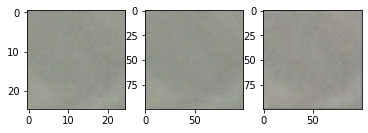

Epoch 16 took 150.6389458179474 sec

Epoch 17
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


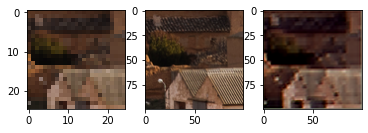

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


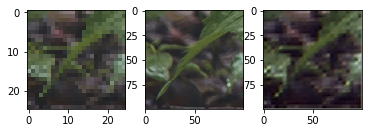

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


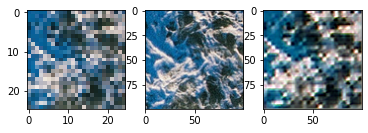

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


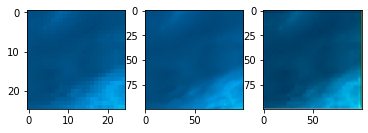

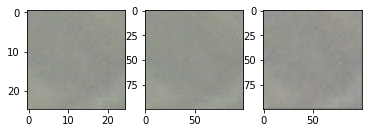

Epoch 17 took 151.02060914039612 sec

Epoch 18
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


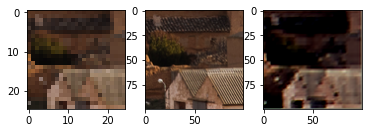

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


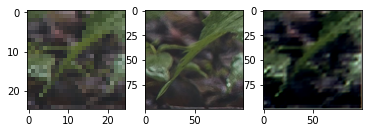

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


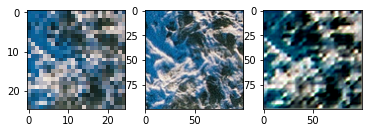

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


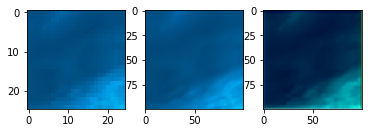

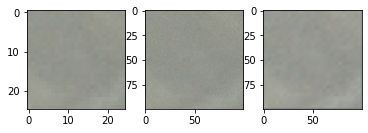

Epoch 18 took 150.8733422756195 sec

Epoch 19
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


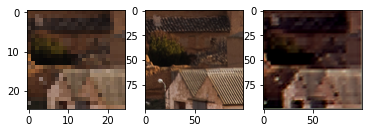

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


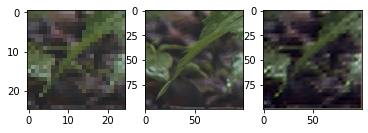

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


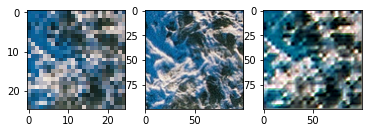

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


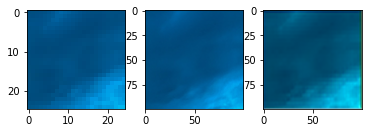

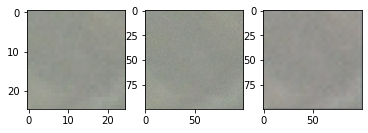

Epoch 19 took 150.98685097694397 sec

Epoch 20
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


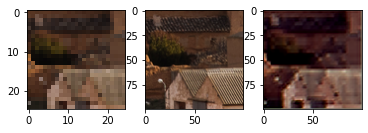

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


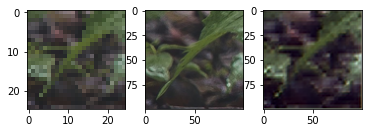

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


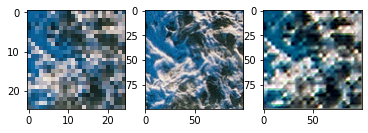

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


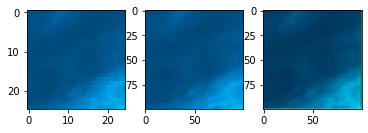

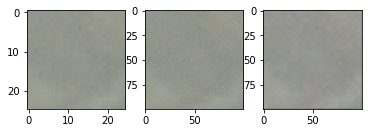

Epoch 20 took 151.03935289382935 sec

Epoch 21
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


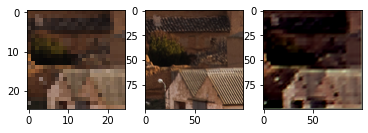

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


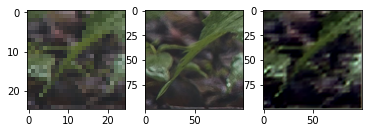

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


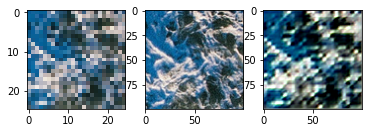

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


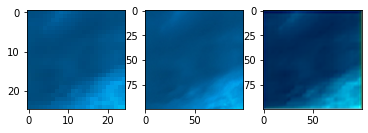

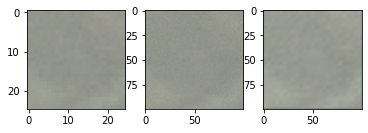

Epoch 21 took 151.06105828285217 sec

Epoch 22
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


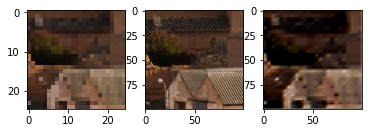

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


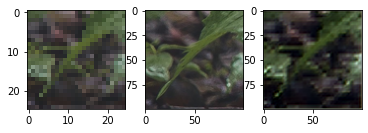

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


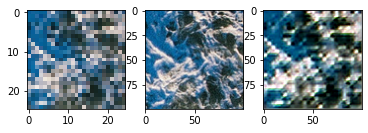

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


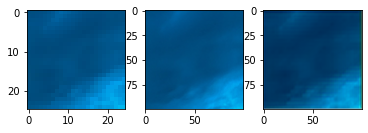

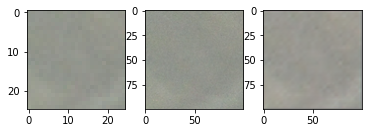

Epoch 22 took 150.6262755393982 sec

Epoch 23
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


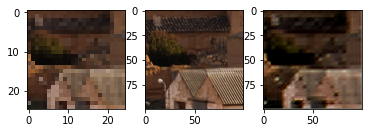

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


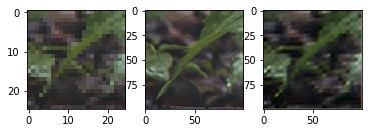

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


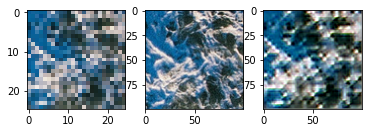

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


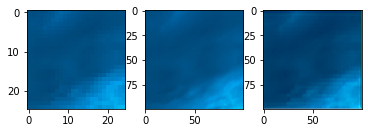

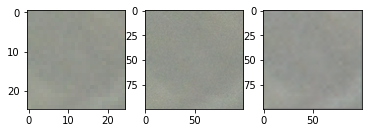

Epoch 23 took 150.85288619995117 sec

Epoch 24
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


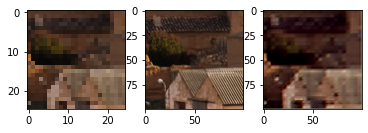

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


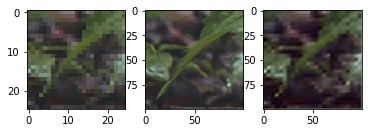

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


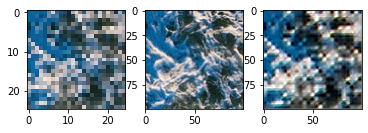

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


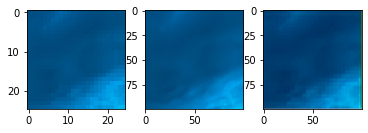

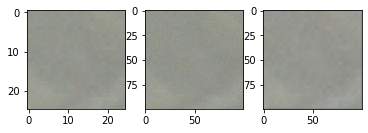

Epoch 24 took 150.88182020187378 sec

Epoch 25
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


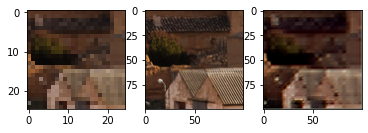

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


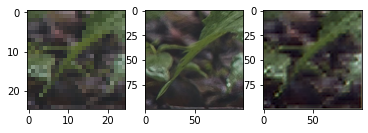

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


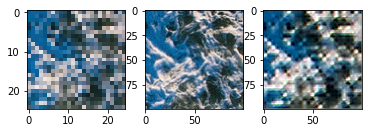

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


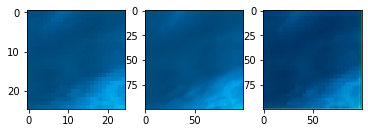

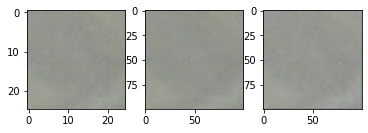

Epoch 25 took 151.226393699646 sec

Epoch 26
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


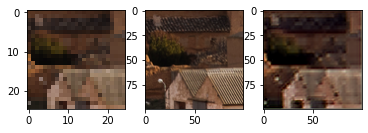

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


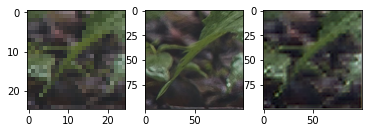

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


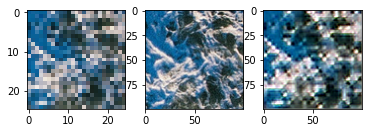

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


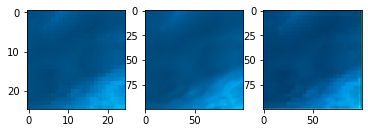

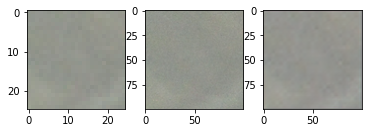

Epoch 26 took 151.13720107078552 sec

Epoch 27
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


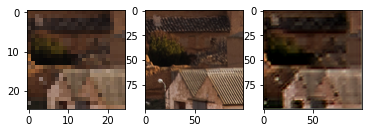

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


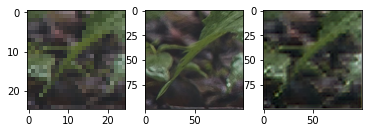

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


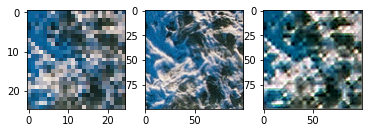

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


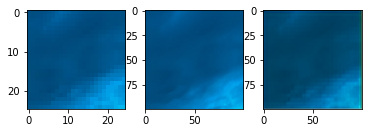

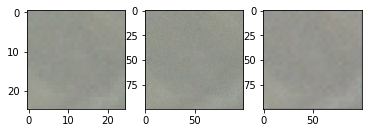

Epoch 27 took 151.11609649658203 sec

Epoch 28
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


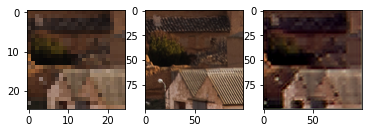

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


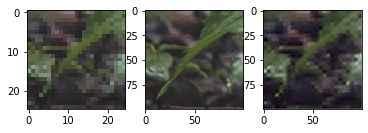

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


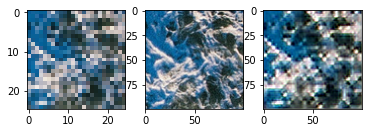

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


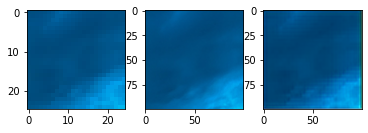

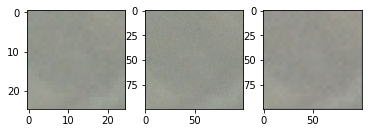

Epoch 28 took 151.30196452140808 sec

Epoch 29
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


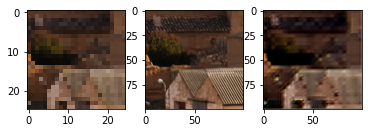

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


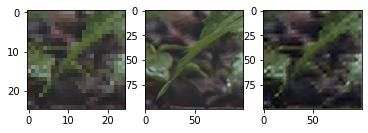

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


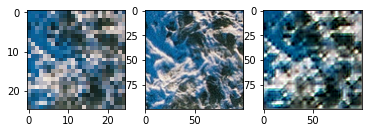

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


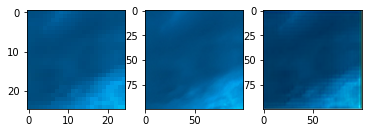

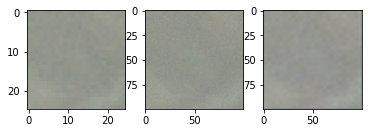

Epoch 29 took 150.62365770339966 sec

Epoch 30
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


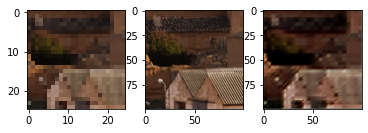

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


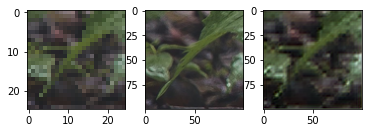

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


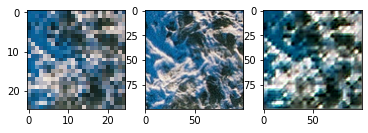

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


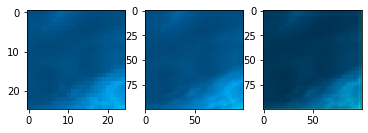

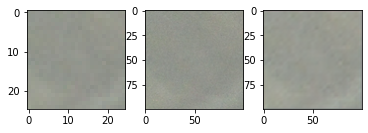

Epoch 30 took 151.32403922080994 sec

Epoch 31
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

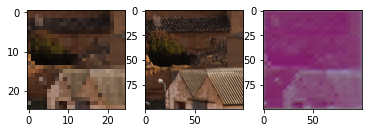

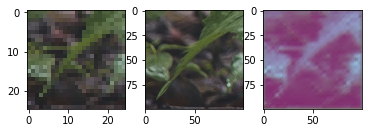

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


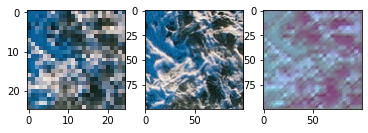

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


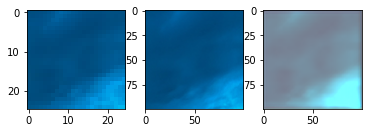

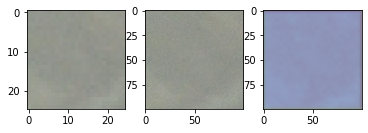

Epoch 31 took 150.640949010849 sec

Epoch 32
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


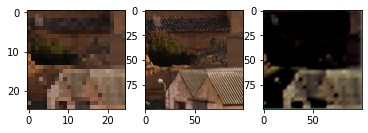

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


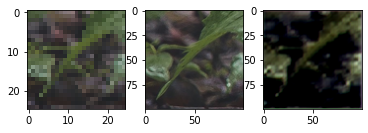

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


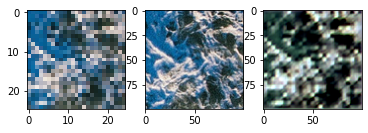

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


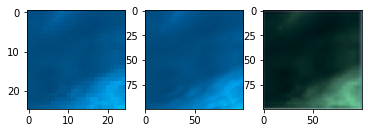

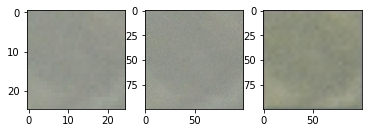

Epoch 32 took 150.90429592132568 sec

Epoch 33
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


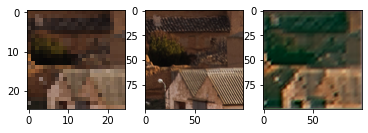

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


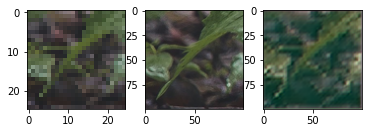

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


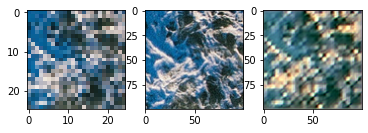

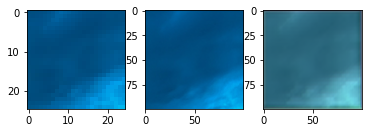

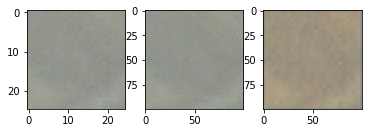

Epoch 33 took 150.83959436416626 sec

Epoch 34
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


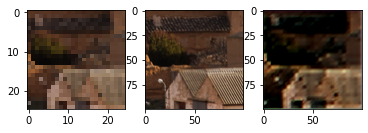

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


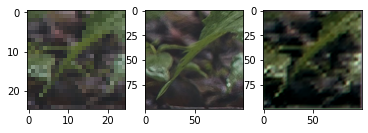

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


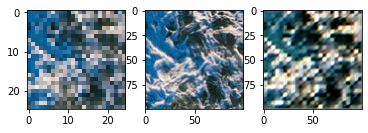

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


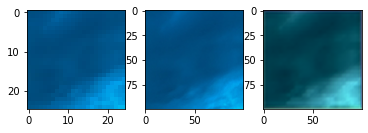

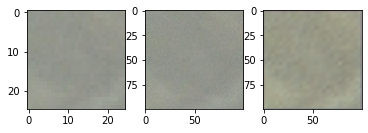

Epoch 34 took 150.88233017921448 sec

Epoch 35
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


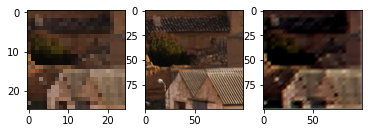

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


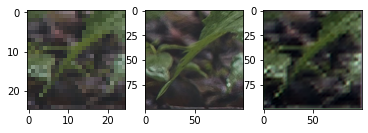

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


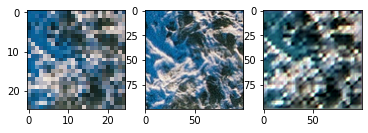

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


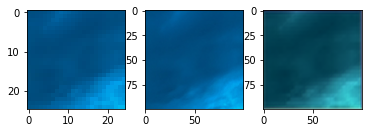

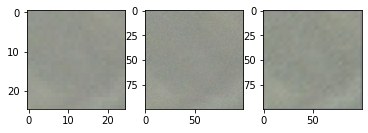

Epoch 35 took 150.96522974967957 sec

Epoch 36
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


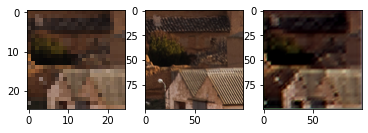

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


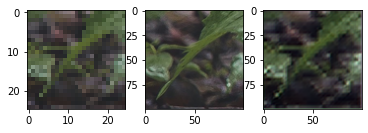

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


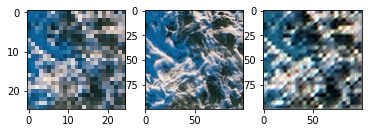

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


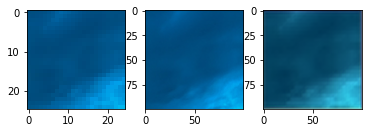

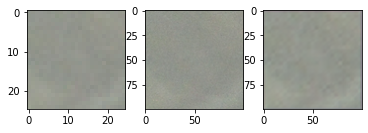

Epoch 36 took 150.87844610214233 sec

Epoch 37
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


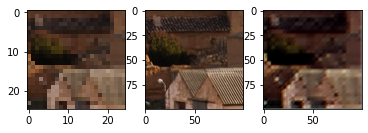

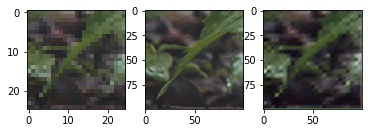

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


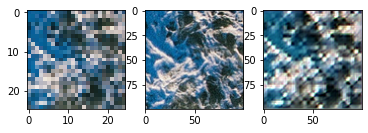

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


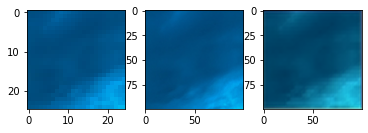

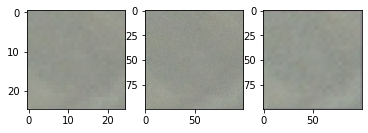

Epoch 37 took 150.9400224685669 sec

Epoch 38
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


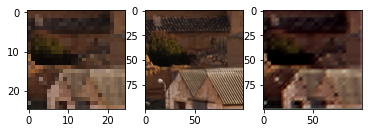

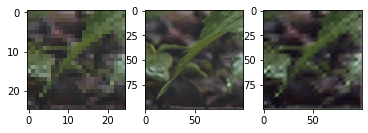

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


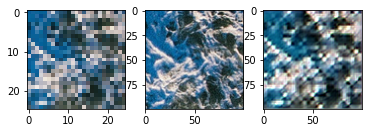

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


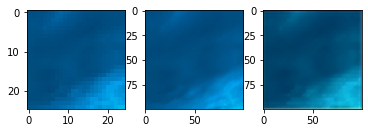

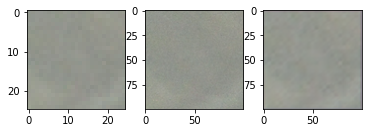

Epoch 38 took 150.84569692611694 sec

Epoch 39
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


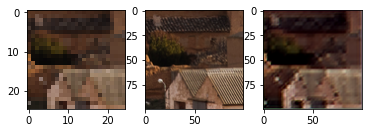

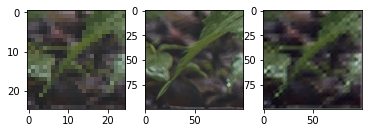

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


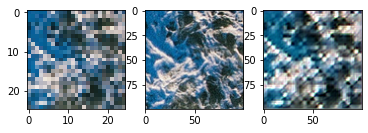

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


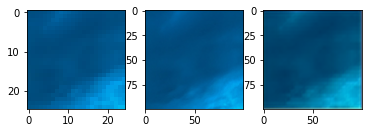

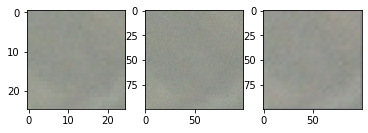

Epoch 39 took 150.7755744457245 sec

Epoch 40
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


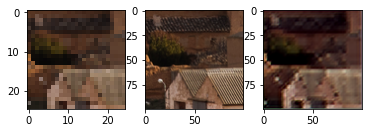

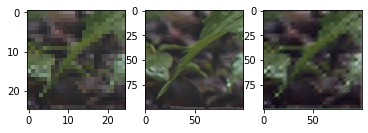

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


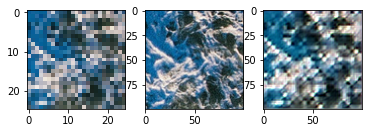

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


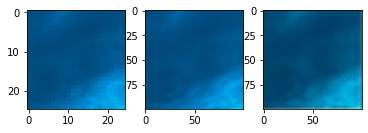

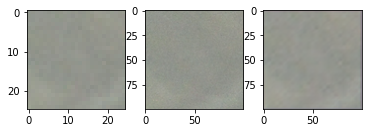

Epoch 40 took 150.94939303398132 sec

Epoch 41
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


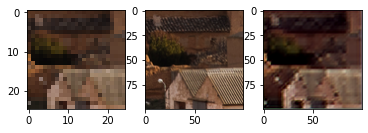

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


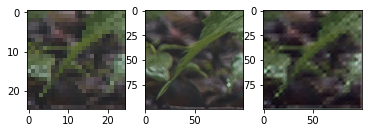

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


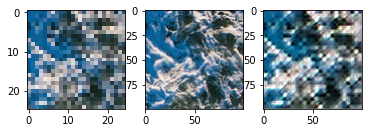

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


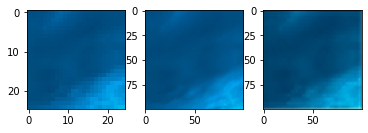

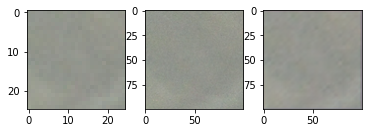

Epoch 41 took 150.81408286094666 sec

Epoch 42
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


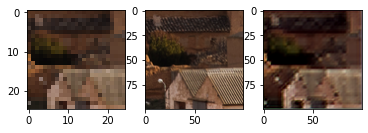

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


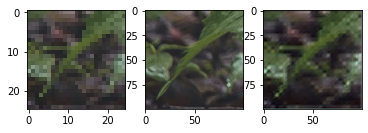

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


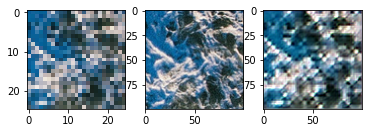

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


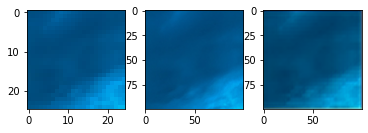

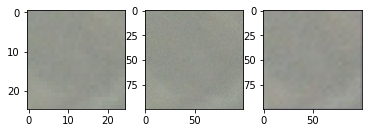

Epoch 42 took 151.0440022945404 sec

Epoch 43
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


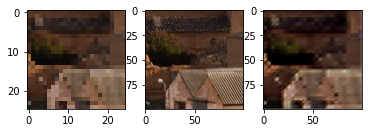

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


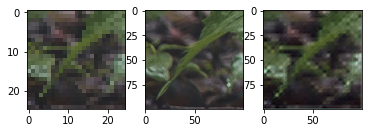

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


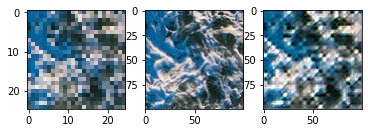

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


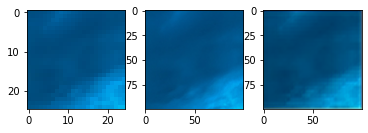

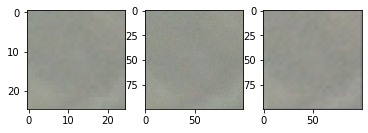

Epoch 43 took 150.63828563690186 sec

Epoch 44
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


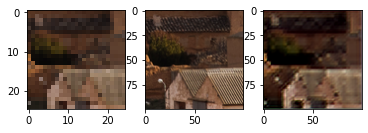

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


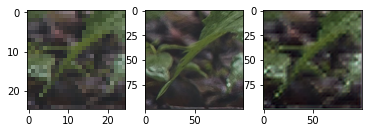

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


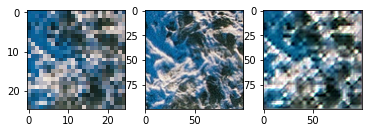

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


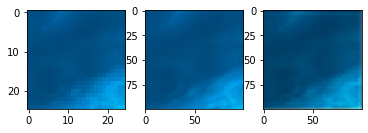

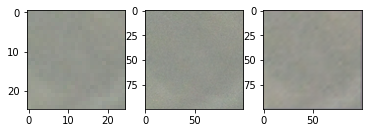

Epoch 44 took 151.22646236419678 sec

Epoch 45
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


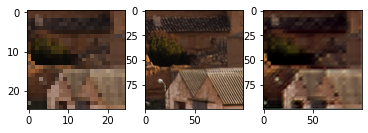

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


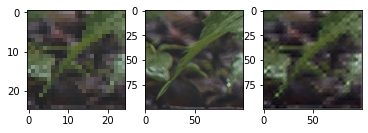

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


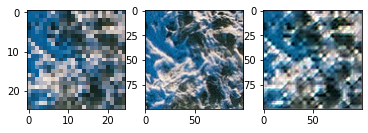

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


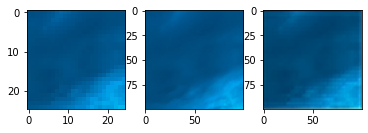

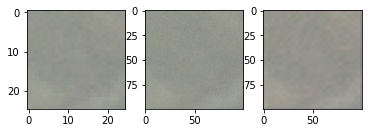

Epoch 45 took 151.19231009483337 sec

Epoch 46
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


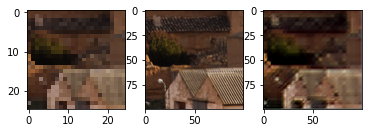

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


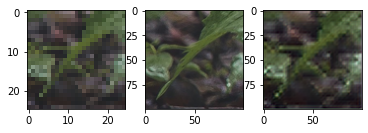

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


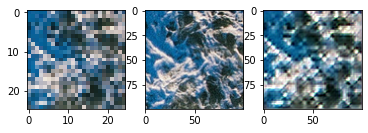

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


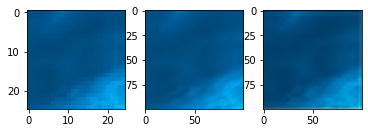

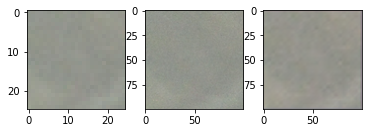

Epoch 46 took 151.37523770332336 sec

Epoch 47
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


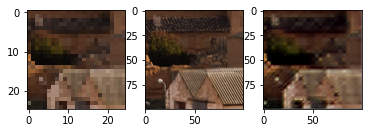

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


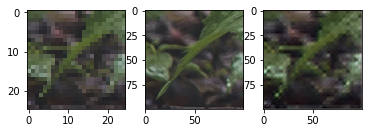

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


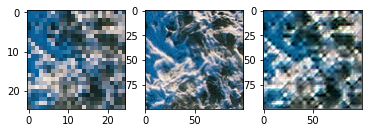

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


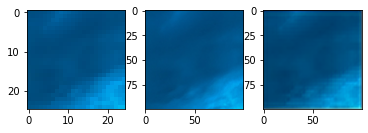

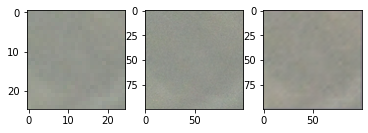

Epoch 47 took 151.45101404190063 sec

Epoch 48
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


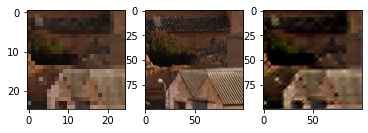

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


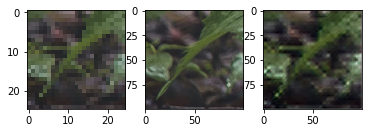

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


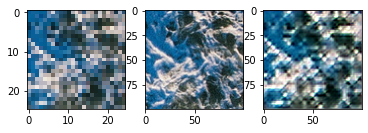

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


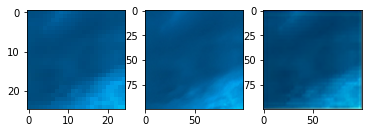

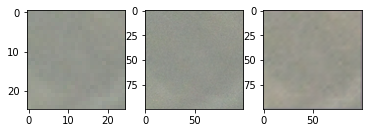

Epoch 48 took 151.4195580482483 sec

Epoch 49
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


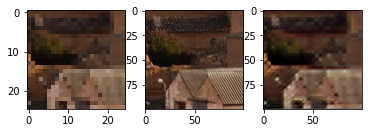

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


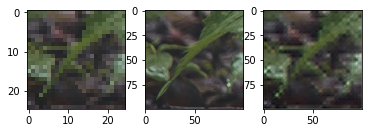

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


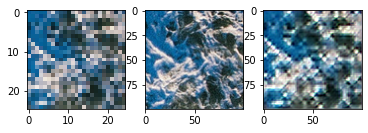

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


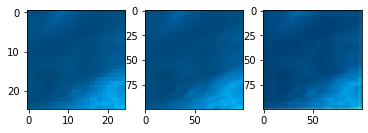

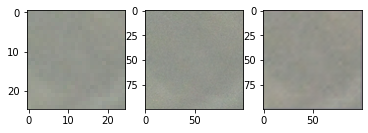

Epoch 49 took 151.11127996444702 sec

Epoch 50
.........10.........20.........30.........40.........50.........60.........70.........
.........90.........100.........110.........120.........130.........140.........150.........
.........170.........180.........190.........

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


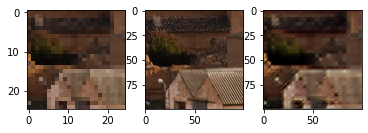

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


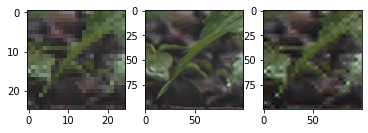

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


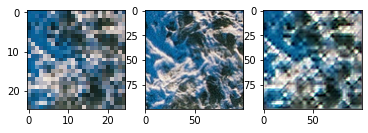

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


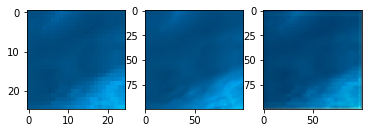

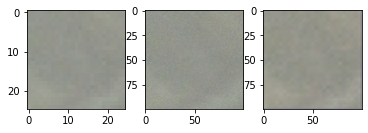

Epoch 50 took 151.4625849723816 sec



In [18]:
BATCH_SIZE = 4
EPOCHS = 50
 
def fit(train_lr, train_hr, epochs):
    for epoch in range(epochs):
        start = time.time()
        print(f"Epoch {epoch + 1}", end="")
        for i in range(len(train_hr) // BATCH_SIZE):
            if i % 10 != 0:
                print(".", end="")
            elif i % 80 == 0:
                print()
            elif i % 10 == 0:
                print(i, end="")
            input_image  = train_lr[BATCH_SIZE * i : BATCH_SIZE * i + BATCH_SIZE]
            target  =  train_hr[BATCH_SIZE * i : BATCH_SIZE * i + BATCH_SIZE]
            train_step(input_image, target, epoch)

        if (epoch + 1) % 5 == 0:
            checkpoint.save(file_prefix = checkpoint_prefix)
        generated = generator(train_lr_dataset[0:5])
        for i in range(len(generated)):
            plt.subplot(1,3,1)
            plt.imshow(train_lr_dataset[i]/2+0.5)
            plt.subplot(1,3,2)
            plt.imshow(train_hr_dataset[i]/2+0.5)
            plt.subplot(1,3,3)
            # print(train_hr_dataset[i])
            plt.imshow(generated[i] / 2 + 0.5)
            # print(generated[i])
            plt.show()
        print ('Epoch {} took {} sec\n'.format(epoch + 1, time.time()-start))

checkpoint_dir = './ESRGAN_checkpoints/'
checkpoint_prefix = os.path.join(checkpoint_dir, "checkpoint")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer, discriminator_optimizer=discriminator_optimizer, generator=generator, discriminator=discriminator)

checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

fit(train_lr_dataset, train_hr_dataset, EPOCHS)

## Final Results

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


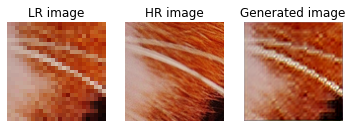

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


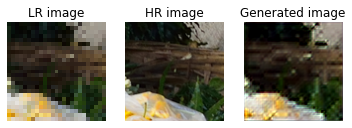

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


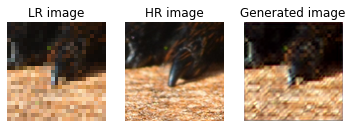

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


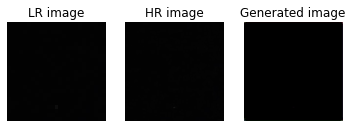

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


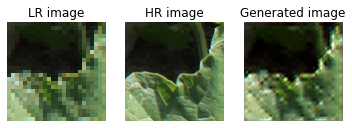

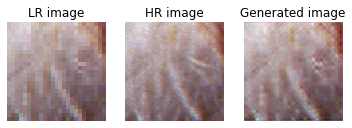

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


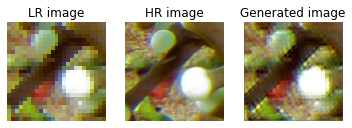

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


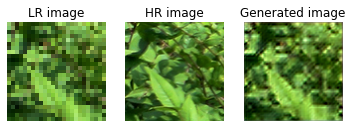

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


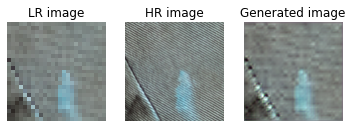

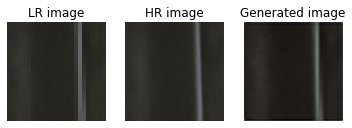

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


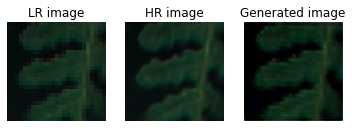

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


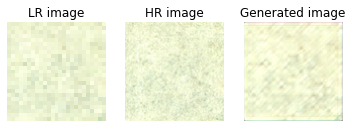

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


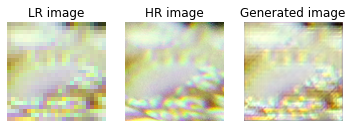

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


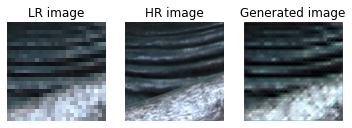

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


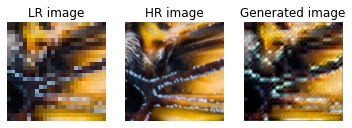

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


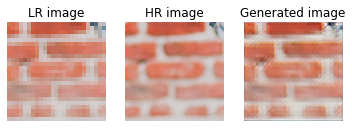

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


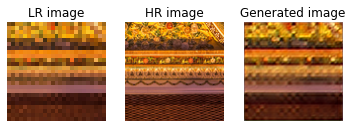

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


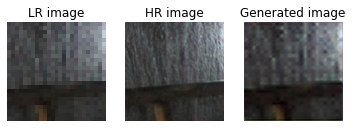

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


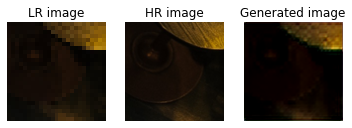

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


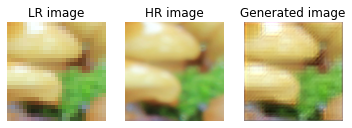

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


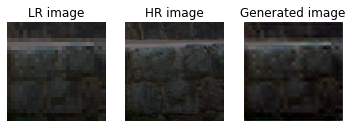

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


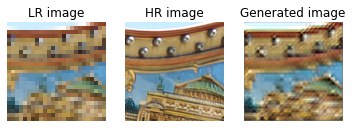

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


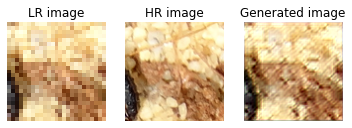

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


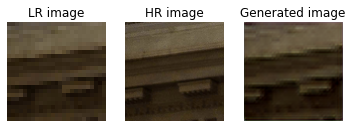

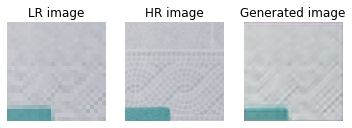

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


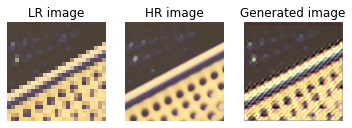

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


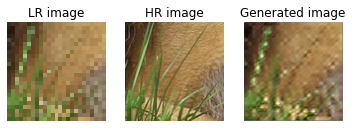

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


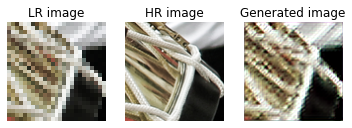

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


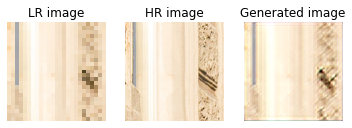

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


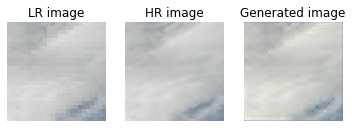

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


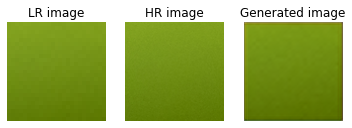

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


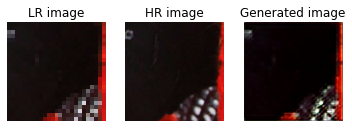

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


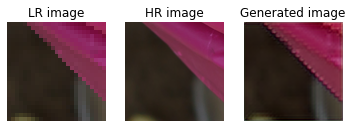

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


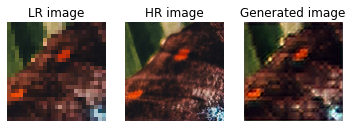

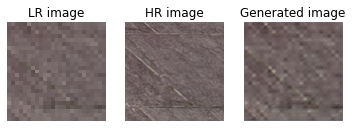

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


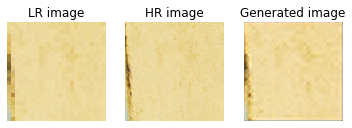

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


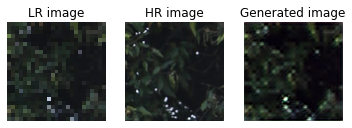

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


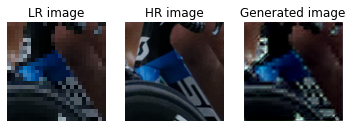

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


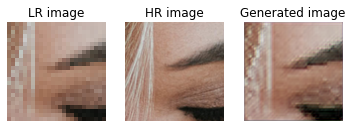

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


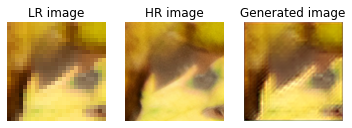

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


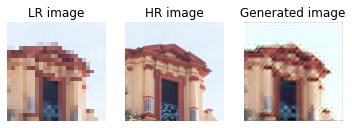

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


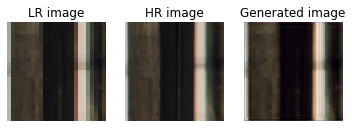

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


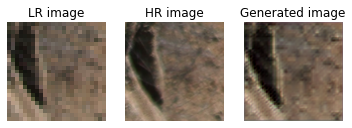

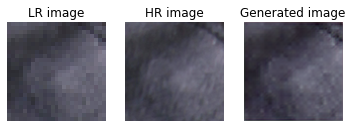

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


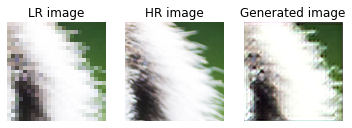

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


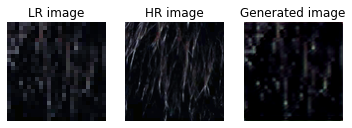

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


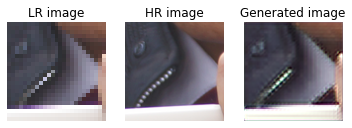

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


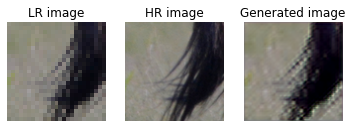

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


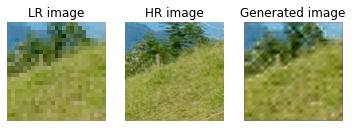

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


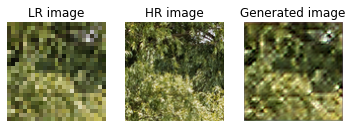

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


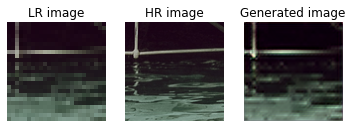

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


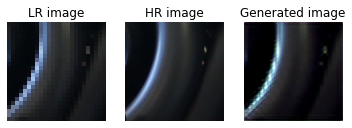

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


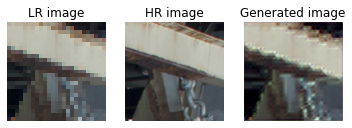

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


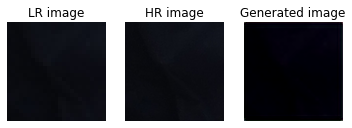

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


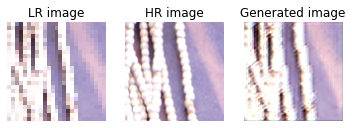

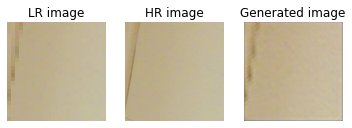

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


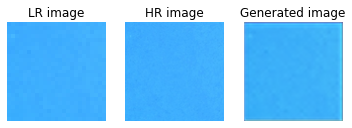

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


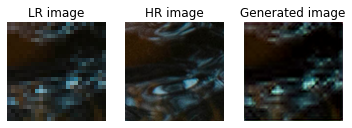

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


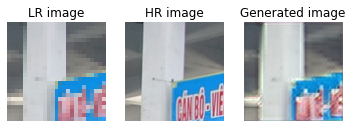

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


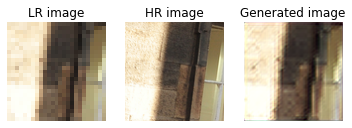

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


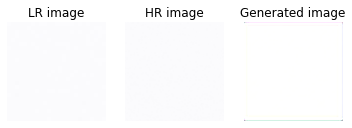

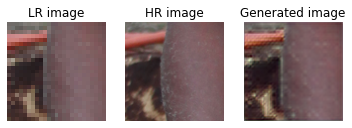

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


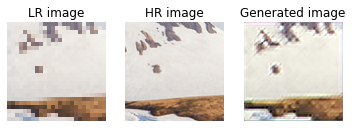

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


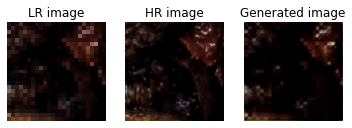

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


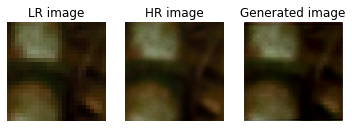

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


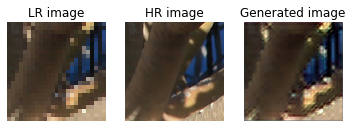

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


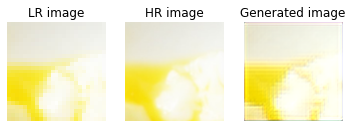

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


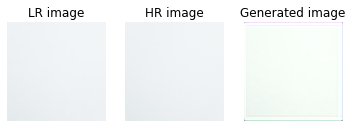

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


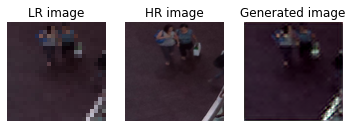

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


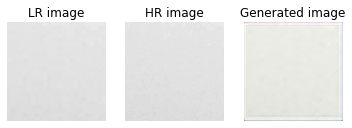

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


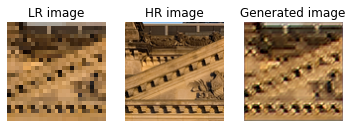

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


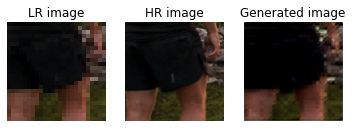

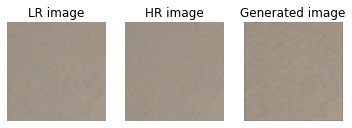

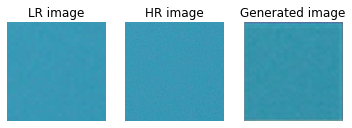

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


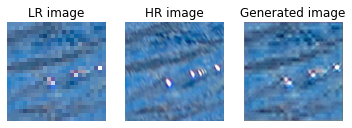

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


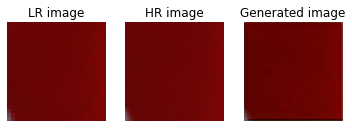

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


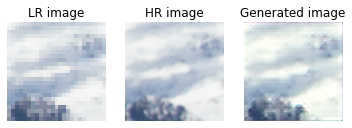

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


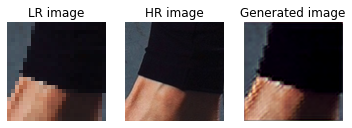

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


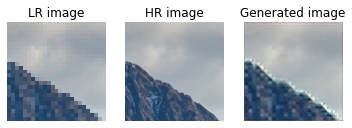

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


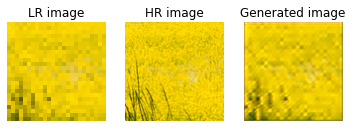

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


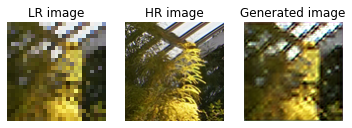

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


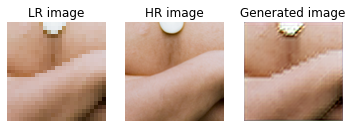

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


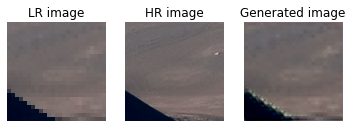

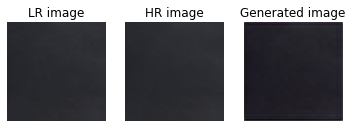

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


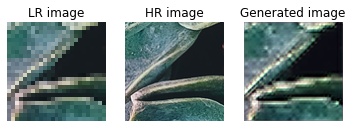

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


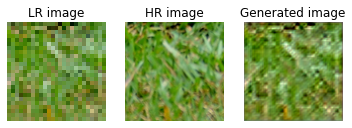

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


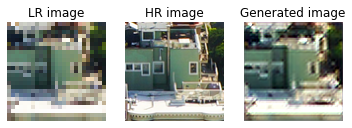

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


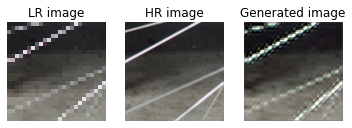

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


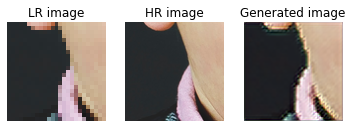

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


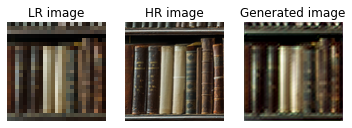

In [19]:
for i in range(70,80):
  generated = generator(train_lr_dataset[10*i:10*i+10])
  for j in range(9):
      f ,ax = plt.subplots(1,3)
      ax[0].imshow(train_lr_dataset[j+10*i]/2+0.5)
      ax[0].set_title("LR image")
      ax[0].axis('off')
      ax[1].imshow(train_hr_dataset[j+10*i]/2+0.5)
      ax[1].set_title("HR image")
      ax[1].axis('off')
      ax[2].imshow(generated[j]/2 + 0.5)
      ax[2].set_title("Generated image")
      ax[2].axis('off')
      plt.show()

In [20]:
checkpoint.save(file_prefix = checkpoint_prefix)

'./ESRGAN_checkpoints/checkpoint-11'